# Initial Conditions Optimization
## Plot History

In [1]:
%matplotlib inline
import matplotlib
matplotlib.font_manager._rebuild()
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as style
style.use('fivethirtyeight')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd
import numpy as np
from datetime import datetime,timedelta
import io
import os
from IPython.display import display, HTML, Markdown
from datetime import date
from datetime import datetime

## Load PlayFair Display and Roboto Fonts from Google

In [2]:
from tempfile import NamedTemporaryFile
import urllib.request
import matplotlib.font_manager as fm

github_url = 'https://github.com/google/fonts/raw/master/ofl/playfairdisplay/static/PlayfairDisplay-Regular.ttf'
url = github_url  # You want the actual file, not some html

headers = {}
headers['User-Agent'] = "Mozilla/5.0 (X11; Linux i686) AppleWebKit/537.17 (KHTML, like Gecko) Chrome/24.0.1312.27 Safari/537.17"

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()

heading_font = fm.FontProperties(fname=f.name, size=28)

github_url = 'https://github.com/google/fonts/raw/master/apache/roboto/static/Roboto-Regular.ttf'
url = github_url  # You want the actual file, not some html

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
subtitle_font = fm.FontProperties(fname=f.name, size=20)


## Load Humor Sans Font

In [3]:
# github_url = 'http://antiyawn.com/uploads/Humor-Sans-1.0.ttf'
# github_url = 'https://github.com/ipython/xkcd-font/blob/master/xkcd-script/font/xkcd-script.ttf'
github_url = 'https://github.com/ipython/xkcd-font/raw/master/xkcd/build/xkcd-Regular.otf'
# github_url = 'https://github.com/shreyankg/xkcd-desktop/blob/master/Humor-Sans.ttf'
url = github_url  # You want the actual file, not some html

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
comic_font = fm.FontProperties(fname=f.name, size=18)

# Main code

In [4]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

## Load Initial Parameters

In [5]:
dfparam = pd.read_csv("data/param.csv")
display(dfparam)


,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,WCASES,WREC,WDTH
0,Brazil,3/2/20,200,10000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
1,China,1/28/20,200,50000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
2,Italy,2/28/20,200,2000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
3,US,2/20/20,200,20000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
4,India,3/10/20,200,10000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8


## Select data set

In [6]:
opt=10

#select history file version, model and states
model="Yabox"
countries=dfparam.country  

#inferior limits for cases
#proportional weights
#no derivative nor end of deaths
#fobjective parameters and sub
#initialConditions_YaboxNew_v5.ipynb
#     bounds=[(20e3,s0),(-2,5),(0,2000), (0,2000),(0,2000),(0,2000),\
#               (0.15,1.0),(0.001,0.5),(0.001,0.5)]
if opt==9:
    version="009" 

#inferior limits for cases
#fobjective parameters but with sub 
#no derivative nor end of deaths
#proportional weights
#limits for start case, s0, i0, r0, d0
#initialConditions_YaboxNew_v6.ipynb
#    bounds=[(20e3,s0),(-2,2),(0,500), (0,500),(0,500),(0,500),\
#              (0.15,1.0),(0.1,0.5),(0.1,0.5)]
if opt==10:
    version="010" 

#inferior limit for weights recovery and deaths
#direct weights
#limits for start case, s0, i0, r0, d0
#fobjective parameters but, no sub
#derivative deaths/cases and inclination zero at the end of deaths
#initialConditions_YaboxNew_v7.ipynb
#     bounds=[(5e3,s0),(-2,2),(0,250), (0,250),(0,250),(0,250),\
#               (0.15,1.0),(0.05,1.0),(0.05,1.0)]
if opt==11:
    version="011" 

#equal weights
#direct weights
#limits for start case, s0, i0, r0, d0
#fobjective parameters but, no sub
#derivative deaths/cases and inclination zero at the end of deaths
#initialConditions_YaboxNew_v8.ipynb
#     bounds=[(5e3,s0),(-2,2),(0,250), (0,250),(0,250),(0,250)]
if opt==12:
    version="012" 

In [7]:
strFile="results/IC_optimizedCountries"+version+".csv"
if os.path.isfile(strFile):
    os.remove(strFile)

## Plot Parameters Function

In [8]:
def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)

def plotParams(country,model,histMin,paramList,paramListNames,version):
    
    #prepare plotting
    color_bg = '#FEF1E5'
    lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC' 

    histShow=histMin.nsmallest(20, ['gtot']).sort_values('gtot',ignore_index=True,ascending=False)

    with plt.xkcd():

        fig, host = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        fig.subplots_adjust(right=0.75)
        host.patch.set_facecolor(darker_highlight)

        plt.rc('font', size=16)        

        #fonts for the thicks
        for label in (host.get_xticklabels() + host.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop

        par1 = host.twinx()
        par2 = host.twinx()
        par3 = host.twinx()

        # Offset the right spine of par2.  The ticks and label have already been
        # placed on the right by twinx above.
        par2.spines["right"].set_position(("axes", 1.1))
        par3.spines["right"].set_position(("axes", 1.2))


        # Having been created by twinx, par2 has its frame off, so the line of its
        # detached spine is invisible.  First, activate the frame but make the patch
        # and spines invisible.
        make_patch_spines_invisible(par2)
        make_patch_spines_invisible(par1)
        make_patch_spines_invisible(par3)

        # Second, show the right spine.
        par2.spines["right"].set_visible(True)
        par2.spines["right"].set_color("white")
        par2.spines["right"].set_linewidth(2)  
        par2.spines["right"].set_linestyle((0,(3,3)))   
        par2.spines["right"].set_capstyle("butt")

        par3.spines["right"].set_visible(True)
        par3.spines["right"].set_color("white")
        par3.spines["right"].set_linewidth(2)  
        par3.spines["right"].set_linestyle((0,(3,3)))   
        par3.spines["right"].set_capstyle("butt")

    # # Hide the left, right and top spines
        host.spines['top'].set_visible(False)
        host.spines['right'].set_visible(False)
        host.spines['left'].set_visible(False)

        p1 = histShow.reset_index().plot(x='index',y=paramList[0],ax=host, style="o-")
        p2 = histShow.reset_index().plot(x='index',y=paramList[1],ax=par1, style="r-")
        p3=  histShow.reset_index().plot(x='index',y=paramList[2],ax=par2, style="g-")
        p4=  histShow.reset_index().plot(x='index',y=paramList[3],ax=par3, style="b-")

        host.set_ylim(0, histShow[paramList[0]].max()*1.5)
        par1.set_ylim(0, histShow[paramList[1]].max()*1.5)
        par2.set_ylim(0, histShow[paramList[2]].max()*1.5)
        par3.set_ylim(0, histShow[paramList[3]].max()*1.5)

        host.set_xlabel("Direction of Convergence")
        host.set_ylabel(paramListNames[0])
        par1.set_ylabel(paramListNames[1])
        par2.set_ylabel(paramListNames[2])
        par3.set_ylabel(paramListNames[3])

        host.legend().remove()    
        par1.legend().remove()   
        par2.legend().remove()  
        par3.legend().remove()  

        line_labels = [paramList[0], paramList[1], paramList[2], paramList[3]]
        plt.subplots_adjust(top=1.2)                       
        fig.legend(labels=line_labels,   # The labels for each line
                   loc=(0.6, 0.68),   # Position of legend
                   borderaxespad=0.1,    # Small spacing around legend box
                   title="Initial Conditions",  # Title for the legend
                   frameon=False
                   )
        host.grid(True, linestyle='--', linewidth=2, color='white',alpha=0.1)
        
        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Parameters History - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=host.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=host.transAxes, 
                    fontproperties=subtitle_font)
        

        fig.tight_layout(pad=0.5)
        strFile ='./results/parameters'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())

        plt.show()
        plt.close(fig)

## Plot History Function

In [9]:
def plotHistory(country,model,histOptAll,versionStr):

    #prepare plotting
    color_bg = '#FEF1E5'
    # lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC'
    plt.rc('font', size=14)
    
    with plt.xkcd():
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Error in Objective Function", fontproperties=comic_font, alpha = .75)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        #PLOTTING itself
        x=histOptAll.index
        y=histOptAll.gtot
        ax.plot(x,y, label="gtot")
        display(Markdown("## 5 Lowest Results"))
        histMin=histOptAll.nsmallest(5, ['gtot']).sort_values('gtot').iloc[:,0:11]
        display(histMin)

        ax.scatter(histMin.index, histMin.gtot,label="5 lowest",c='red',marker='*',s=400)
        histOptAll.rolling(100).mean()['gtot'].plot(label="100th average",c='gray')

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Initial Conditions Optimization - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/convergence_'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        histMin=histOptAll.iloc[:,0:9]
        histMin.sort_index(inplace=True)
        
        histMin['error']=histMin.gtot/histMin.gtot.max()*100
        x=histMin.index[histMin.error<(histMin.error.mean()-0.1*histMin.error.std())]
        y=histMin.error[histMin.error<(histMin.error.mean()-0.1*histMin.error.std())]
                
        ax.plot(x, y, label="mean-$10\% \cdot \sigma$",c='green')
        histMin2=histMin.nsmallest(10, ['gtot']).sort_values('gtot')
        ax.scatter(histMin2.index, histMin2.gtot/histMin.gtot.max()*100,
                   label="10 lowest",c='red',marker='*',s=400)
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Relative Error $g_{tot}/max(g_{tot})$ [%]", 
                   fontproperties=comic_font, alpha = .75)

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Selected Minimum Values - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/minimumPoints_'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        plt.close()
        
    return histMin
        

# Loop Data All Countries

In [10]:
def calculateWeights(df):
    wt=df.wcases+df.wrec+df.wdth
    df['wcases']=df.wcases/wt
    df['wrec']=df.wrec/wt
    df['wdth']=df.wdth/wt
    df['wcases'] = df['wcases'].apply(lambda x: round(x,4))
    df['wrec'] = df['wrec'].apply(lambda x: round(x,4))
    df['wdth'] = df['wdth'].apply(lambda x: round(x,4))
    return df

# Results for Brazil

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1113,1.635210e+08,2020-03-01,458,5629136,68,92,491,0.7823,0.1094,0.1083


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1113,1.635210e+08,2020-03-01,458,5629136,68,92,491,0.7823,0.1094,0.1083
1131,2.591173e+08,2020-02-29,473,7842555,28,448,112,0.6728,0.0723,0.2549
1529,3.042536e+08,2020-03-01,414,7404175,359,9,121,0.6398,0.0808,0.2794
417,3.219565e+08,2020-03-02,51,7170714,279,369,277,0.6763,0.1340,0.1897
1315,3.417055e+08,2020-03-01,249,7675862,301,113,316,0.7659,0.0929,0.1412


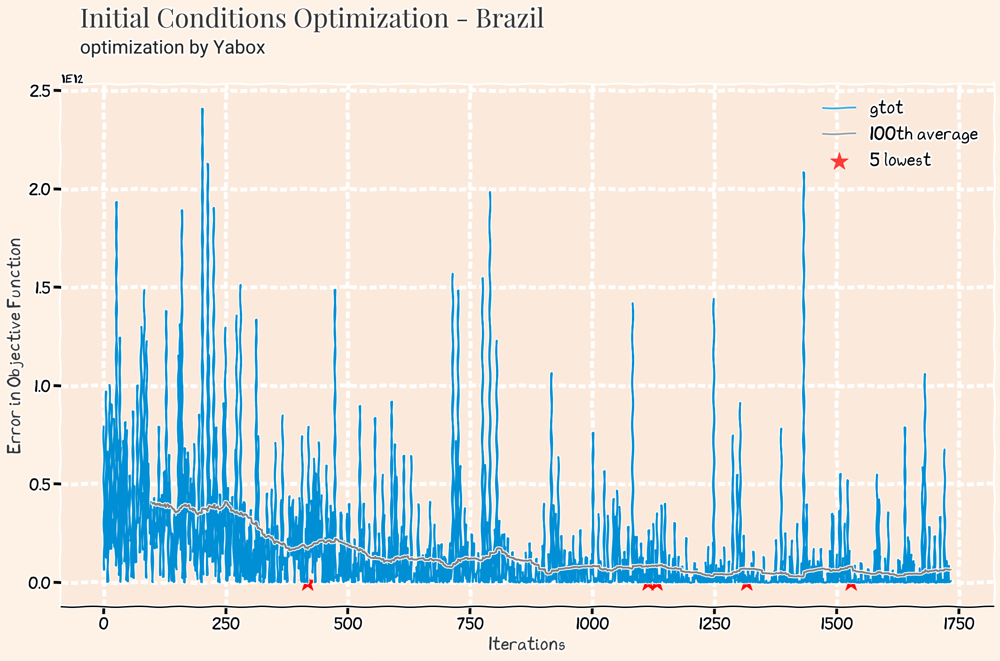

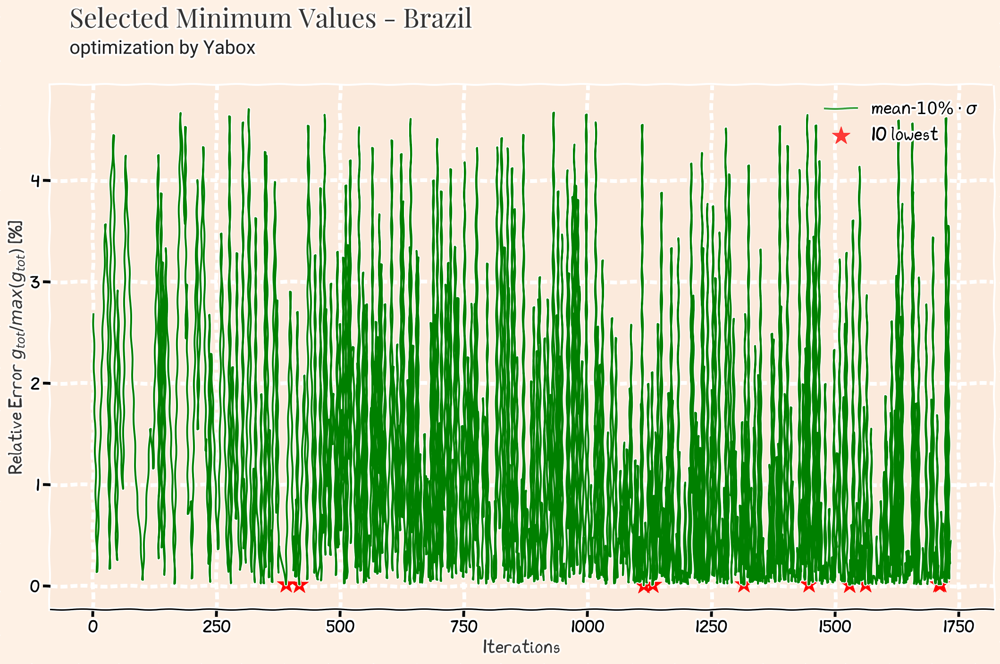

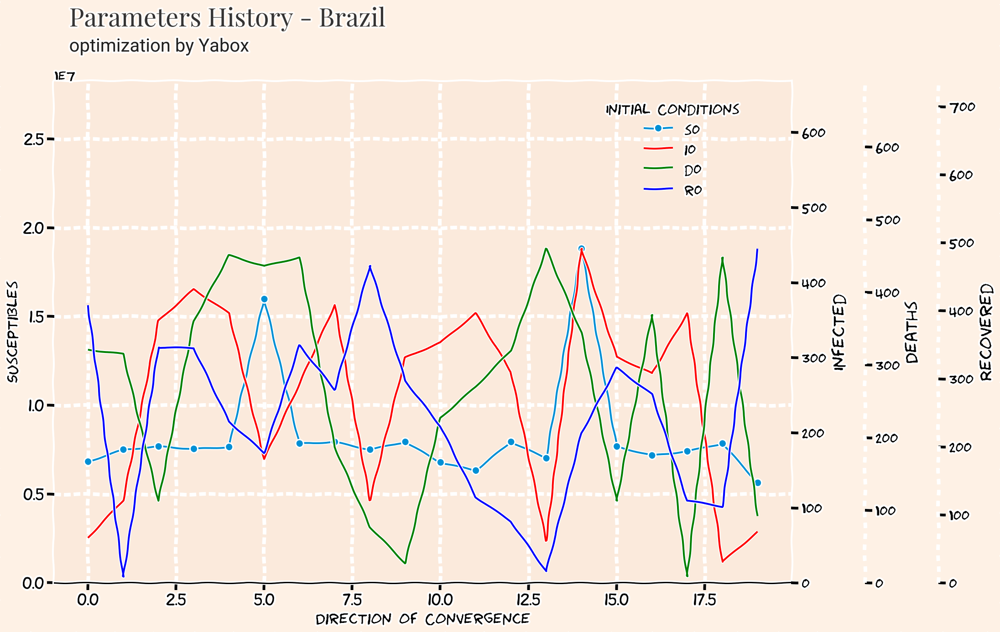

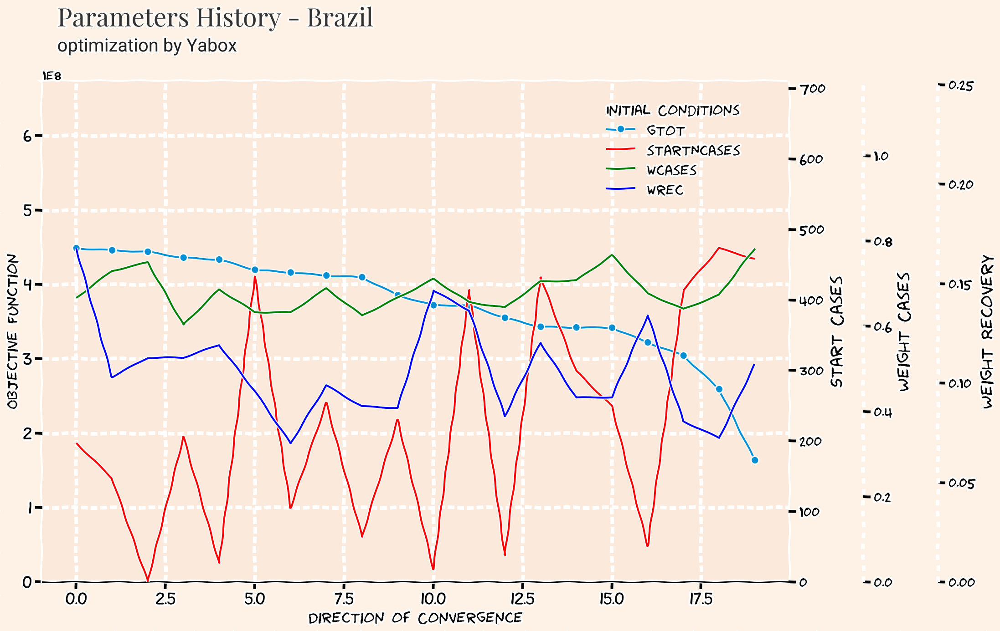

# Results for China

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1820,9.877302e+06,2020-01-26,283,2440195,227,343,293,0.7136,0.078,0.2084


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1820,9.877302e+06,2020-01-26,283,2440195,227,343,293,0.7136,0.0780,0.2084
1415,2.284822e+07,2020-01-26,355,2440195,227,299,110,0.7136,0.0780,0.2084
96,2.410293e+07,2020-01-26,247,280906641,231,178,227,0.5807,0.2282,0.1911
2405,2.516628e+07,2020-01-29,283,2440195,227,358,77,0.6318,0.0866,0.2816
2260,2.548457e+07,2020-01-27,255,47933403,403,341,239,0.6259,0.1223,0.2518


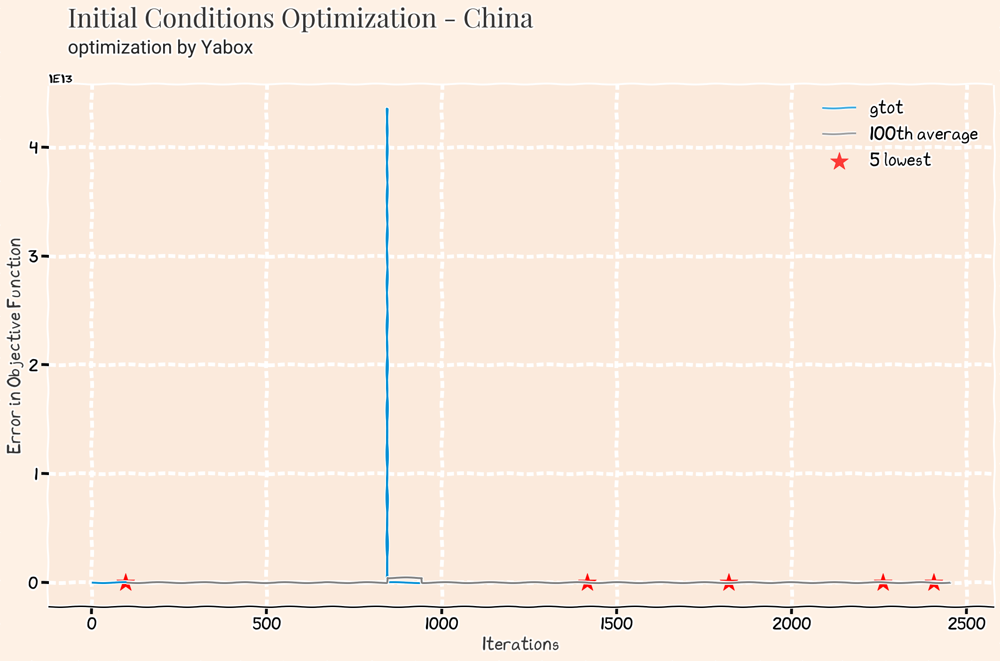

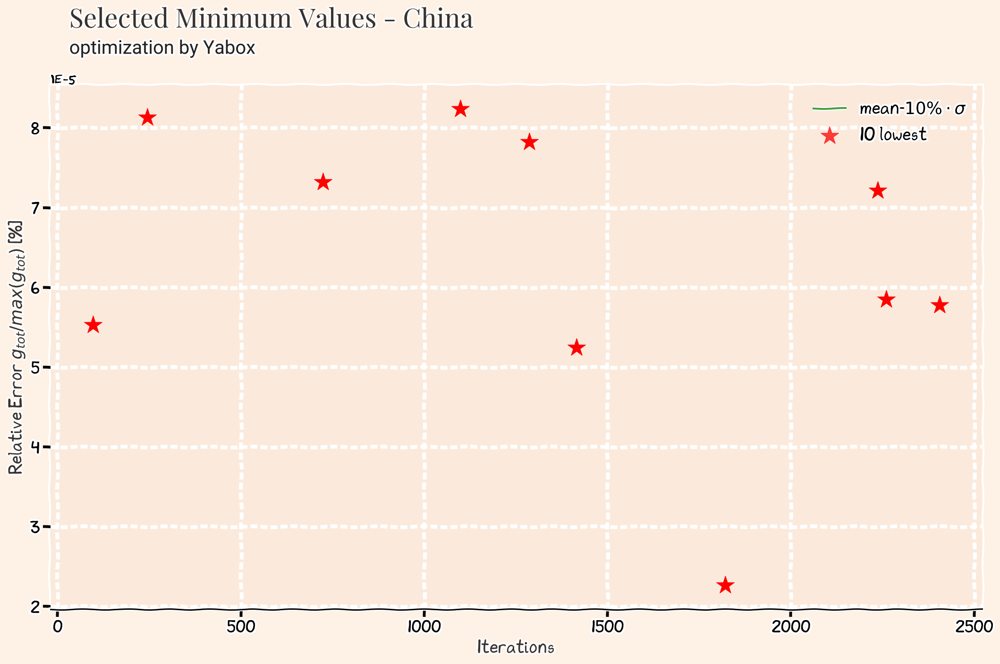

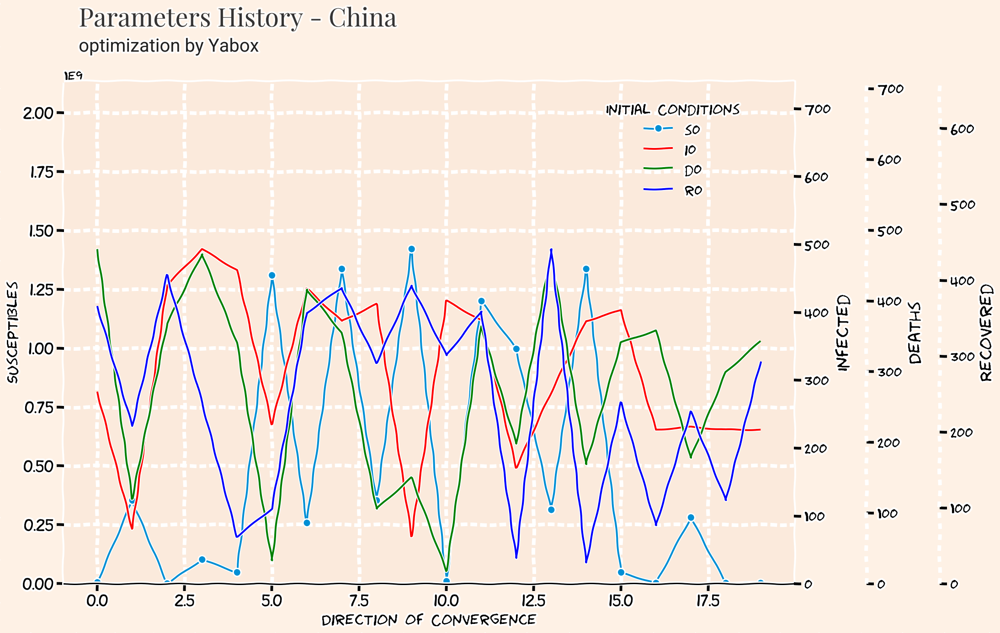

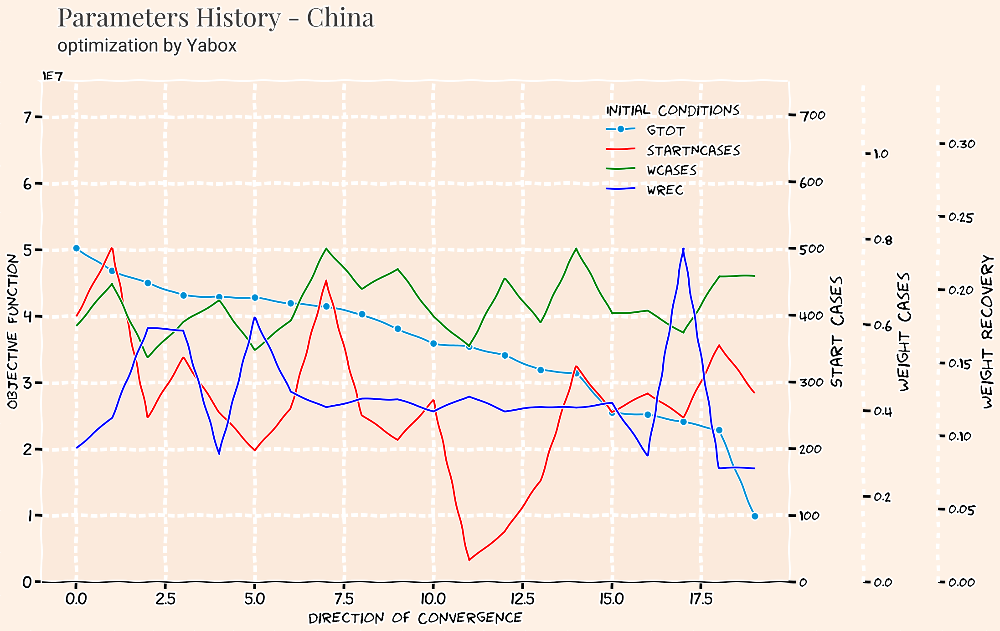

# Results for Italy

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1565,1.032552e+07,2020-02-28,435,255631,334,49,440,0.6612,0.0822,0.2567


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1565,1.032552e+07,2020-02-28,435,255631,334,49,440,0.6612,0.0822,0.2567
1682,1.068098e+07,2020-02-28,177,537345,135,99,61,0.7274,0.1346,0.1379
1725,1.126277e+07,2020-02-28,290,530315,318,330,130,0.6997,0.1797,0.1206
1327,1.220830e+07,2020-02-29,116,503869,315,326,415,0.6409,0.1332,0.2259
1601,1.387849e+07,2020-02-29,415,624466,368,404,300,0.7068,0.0921,0.2010


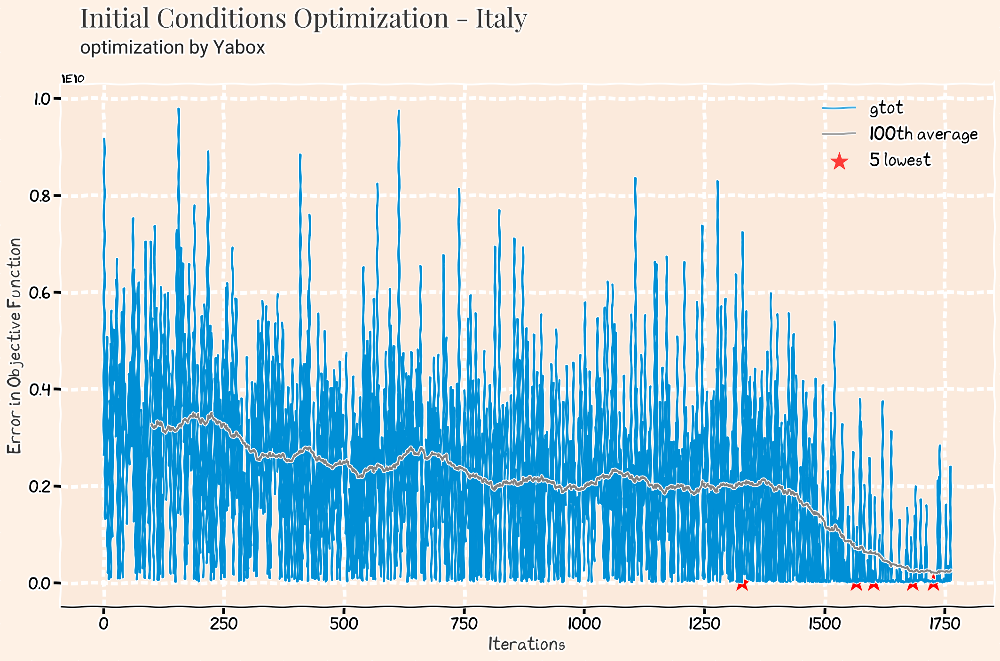

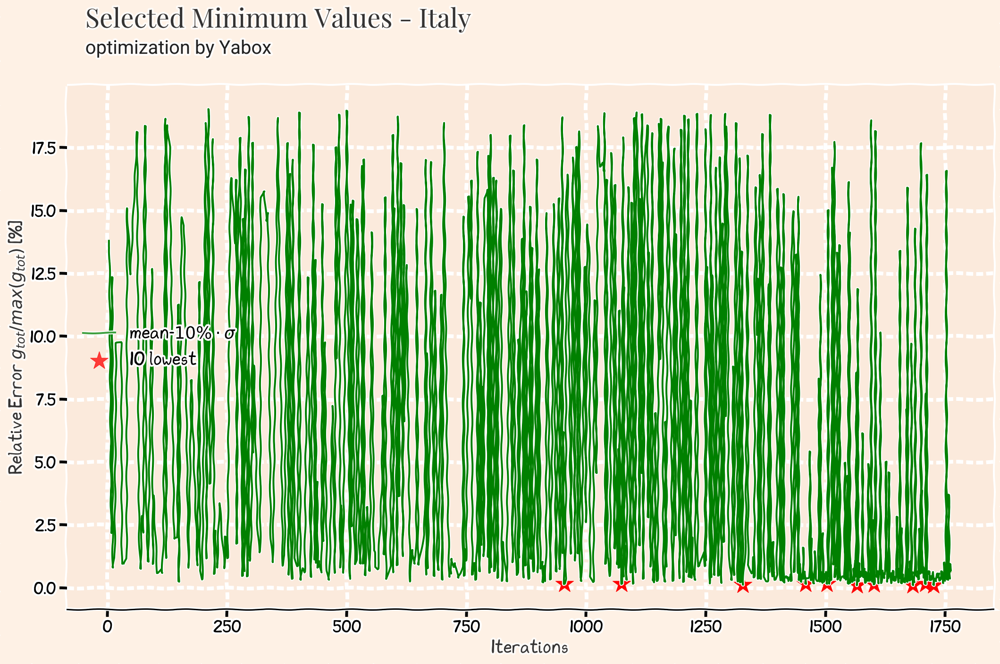

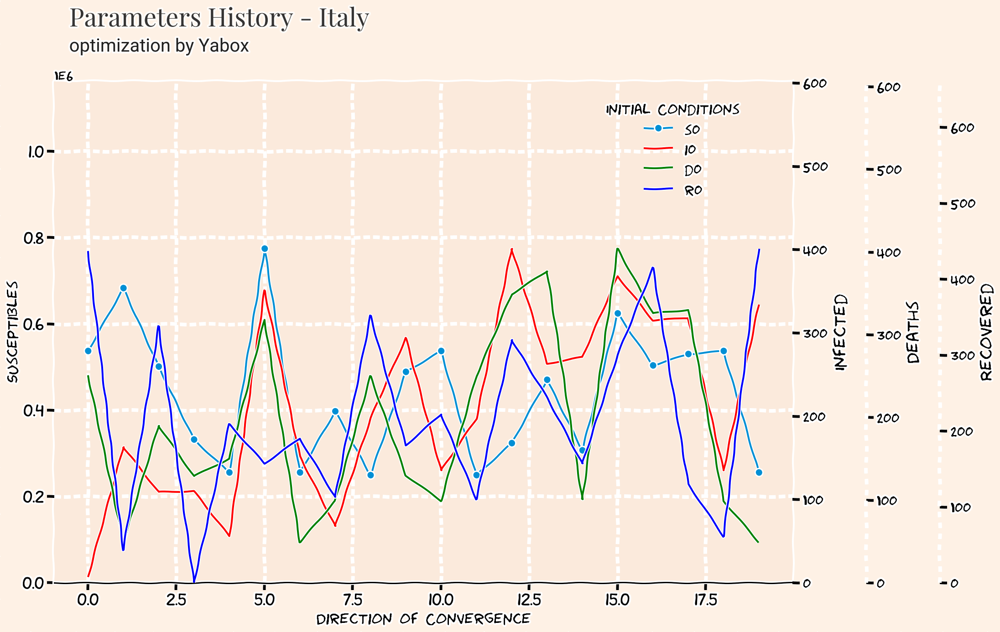

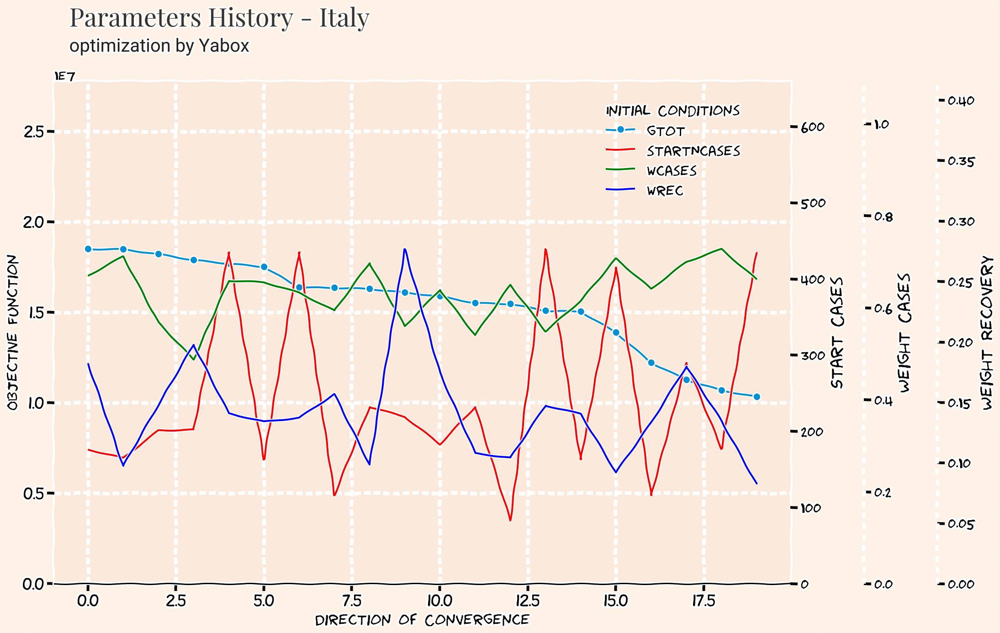

# Results for US

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1613,1.967455e+08,2020-02-20,452,6374161,259,70,389,0.4119,0.111,0.4771


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1613,1.967455e+08,2020-02-20,452,6374161,259,70,389,0.4119,0.1110,0.4771
1250,2.647178e+08,2020-02-19,251,6662636,36,380,160,0.6308,0.1043,0.2649
1203,3.173918e+08,2020-02-18,49,8057850,50,176,78,0.4491,0.1782,0.3727
1680,3.465008e+08,2020-02-20,283,6208474,123,447,296,0.4369,0.1242,0.4389
828,3.481365e+08,2020-02-19,369,8197165,339,476,18,0.6658,0.0915,0.2427


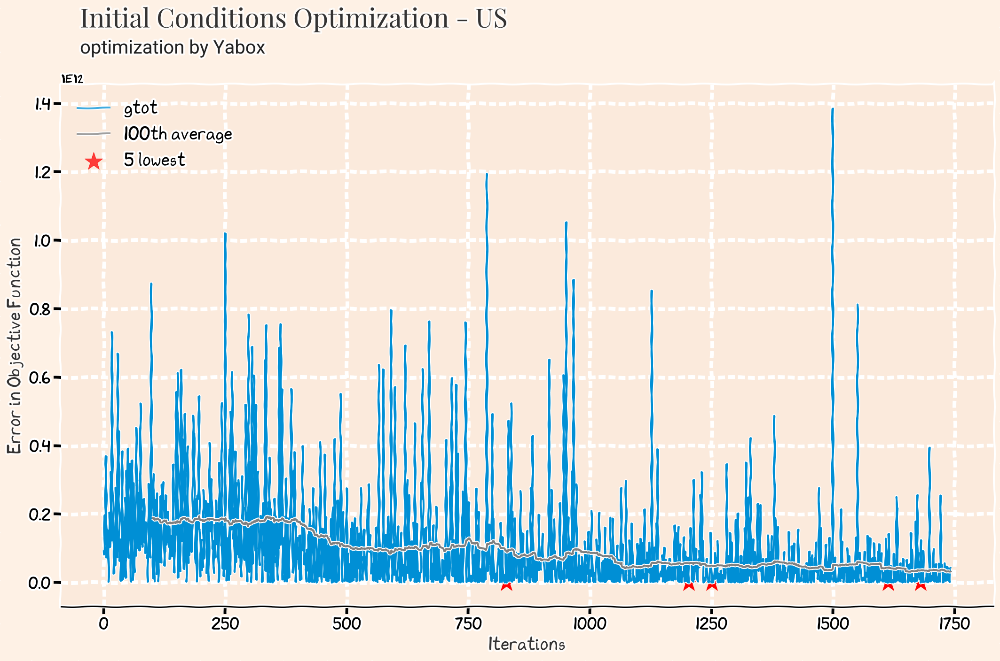

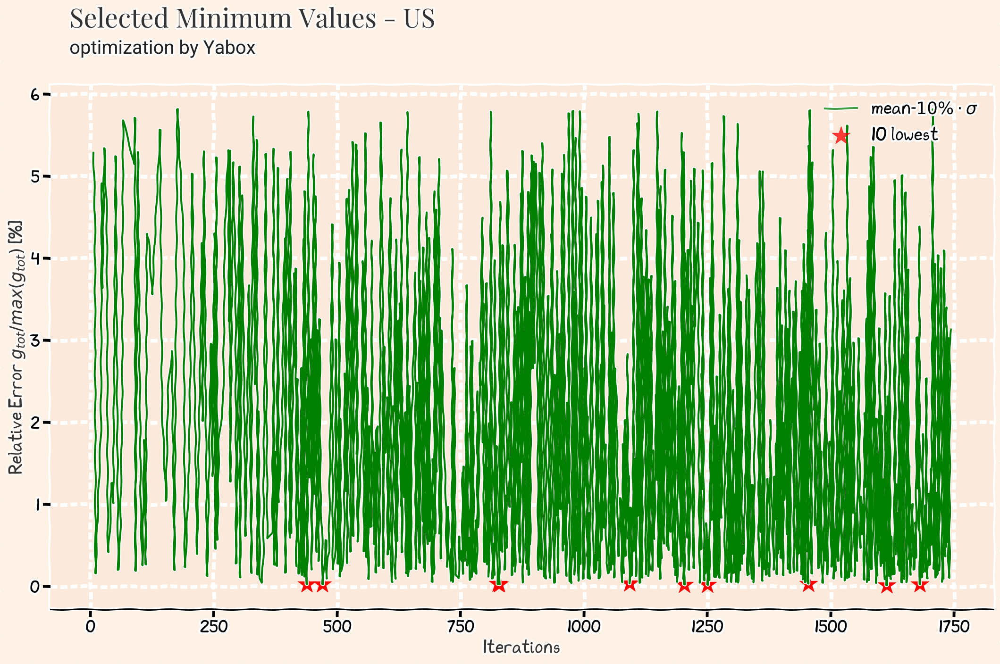

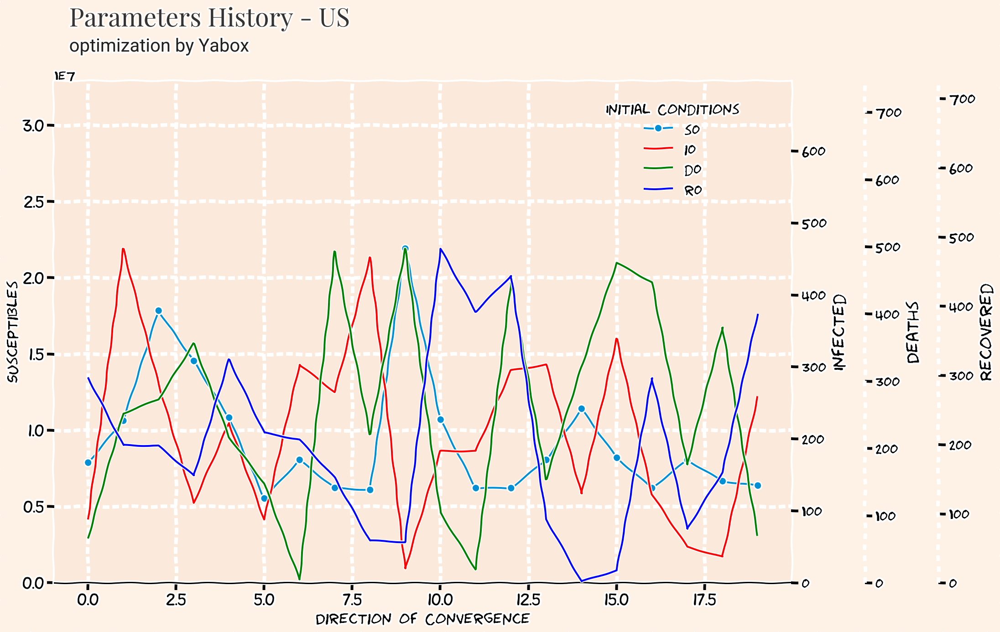

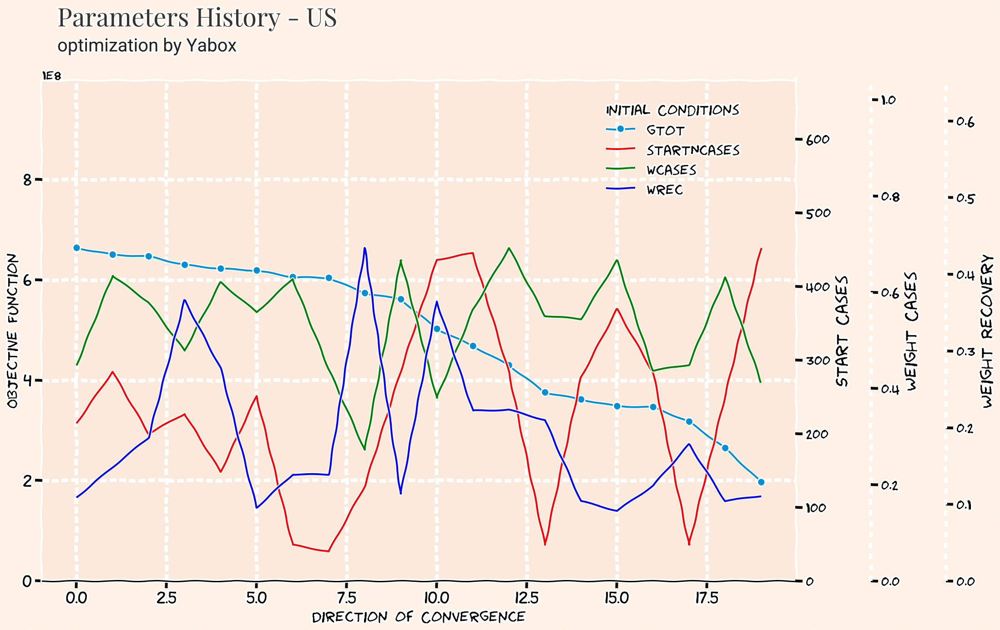

# Results for India

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1389,1.540461e+08,2020-03-11,310,18428570,273,84,185,0.7,0.1543,0.1456


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
1389,1.540461e+08,2020-03-11,310,18428570,273,84,185,0.7000,0.1543,0.1456
1448,1.574629e+08,2020-03-08,173,45741713,438,436,340,0.5780,0.2102,0.2118
1694,1.820789e+08,2020-03-11,467,17149122,393,332,194,0.7417,0.1048,0.1535
351,2.201709e+08,2020-03-10,165,42224255,299,398,451,0.6320,0.1507,0.2173
1051,2.509287e+08,2020-03-11,24,15834240,442,134,54,0.5487,0.1129,0.3384


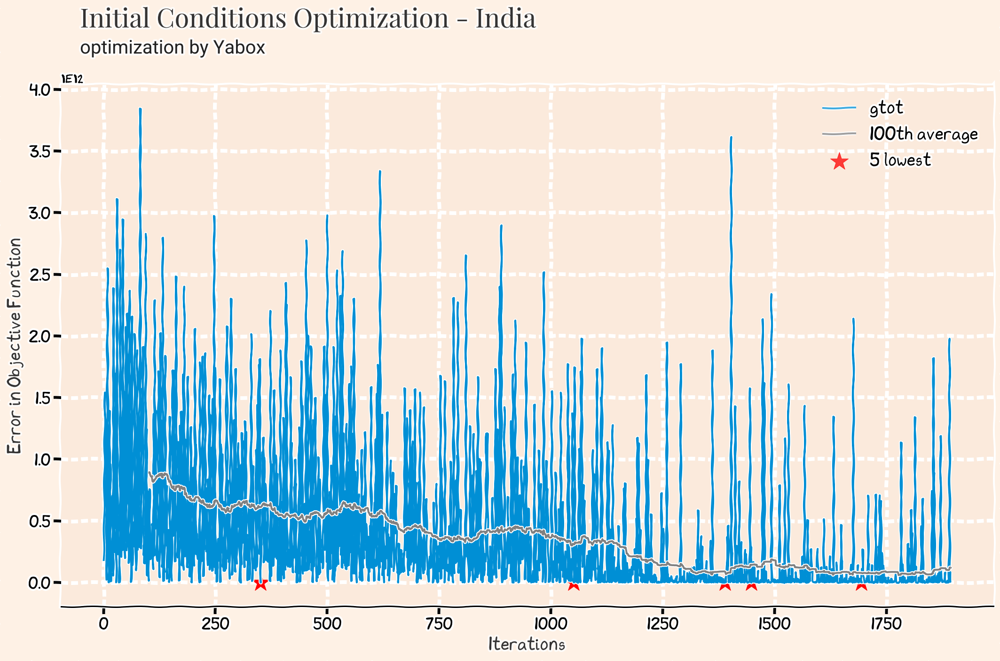

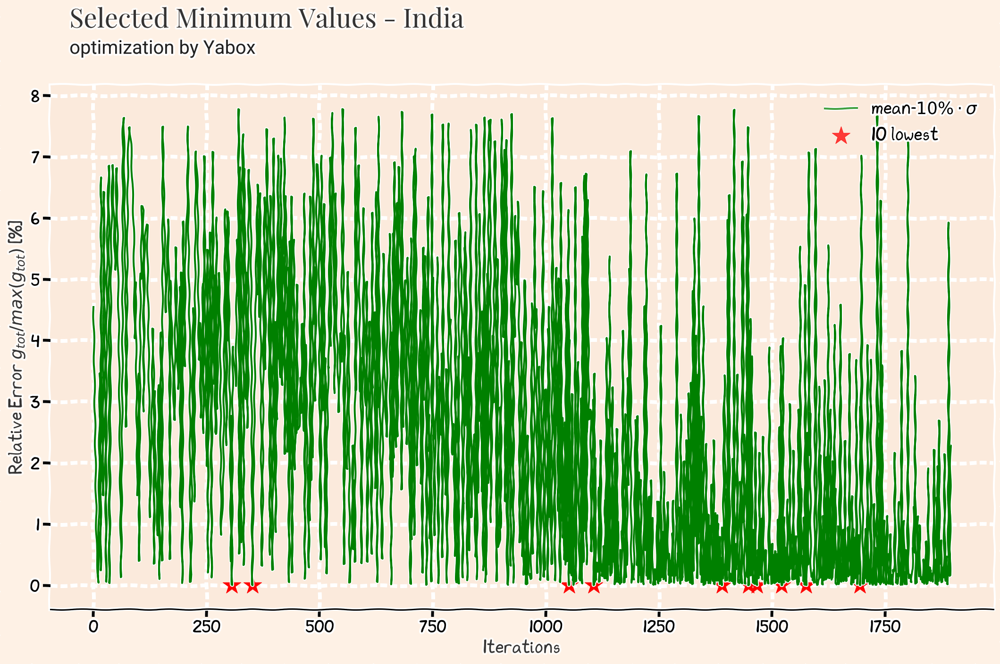

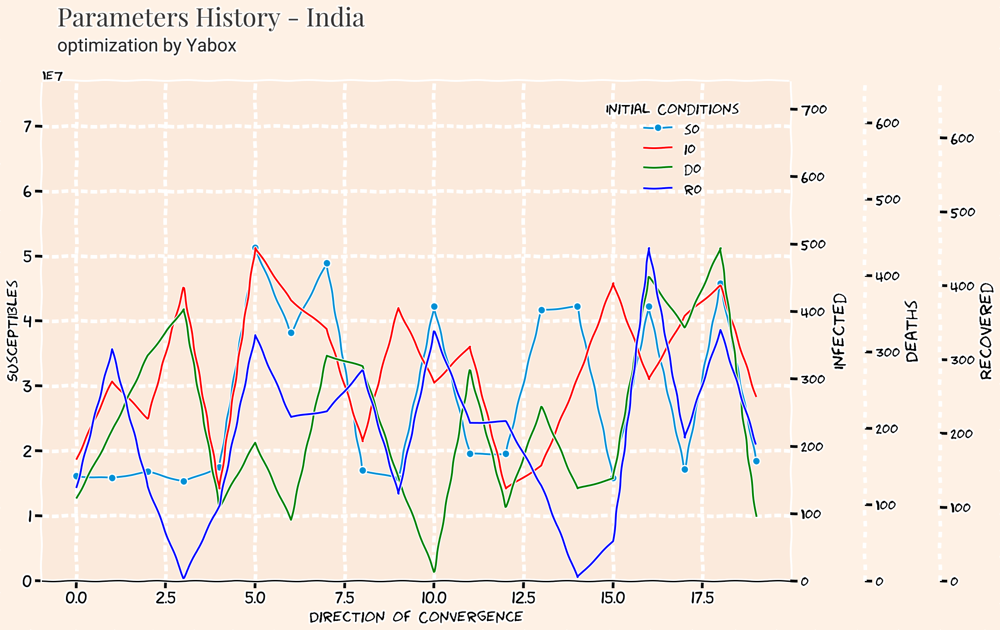

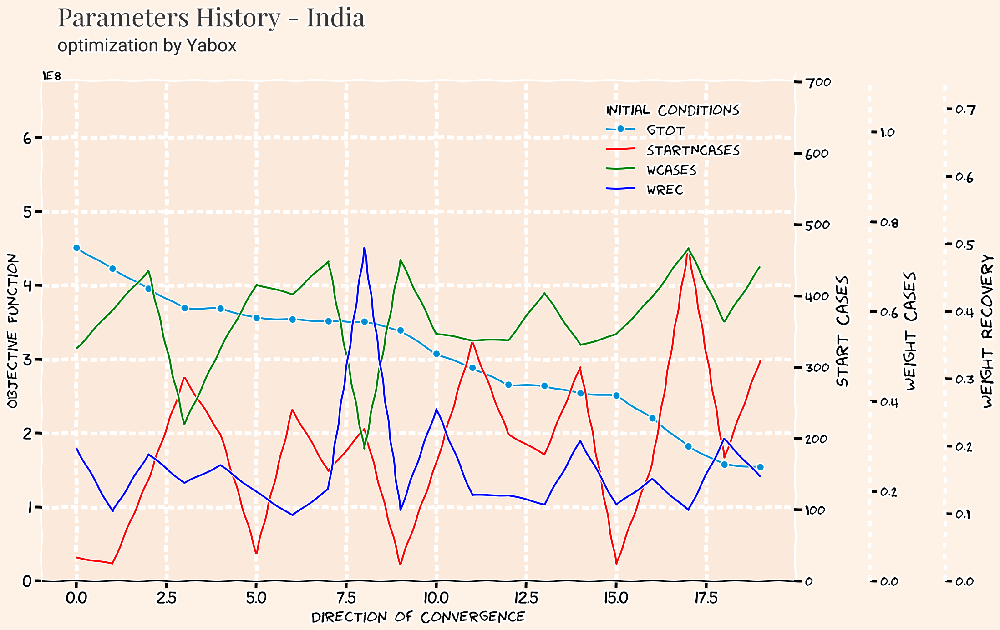

In [11]:
ggtot=[]
for country in countries:
    versionStr=version
    dateparse = lambda x: datetime.strptime(x, ' %m/%d/%y')
    histOptAll= pd.read_table('./results/history_'+country+versionStr+'.csv', sep=",", \
                                index_col=0, header=None, parse_dates=[3], date_parser=dateparse,
        names = ["country","gtot",\
            "s0","startdate","i0","d0","r0","startNcases","wcases","wrec","wdth"])
    histOptAll = histOptAll[['gtot', 'startdate','startNcases','s0',"i0","d0","r0","wcases","wrec","wdth"]]
        
    #clean data
    histOptAll=histOptAll.dropna(how='all')
    histOptAll.gtot=pd.to_numeric(histOptAll.gtot, errors='coerce')
    histOptAll = histOptAll.reset_index(drop=True)
    histOptAll = histOptAll[histOptAll.loc[:,"gtot"]<0.5e14]
    
    #format integers and decimal places
    histOptAll['d0'] = histOptAll['d0'].apply(lambda x: int(x+0.5))
    histOptAll['startNcases'] = histOptAll['startNcases'].apply(lambda x: int(x+0.5))
    histOptAll['s0'] = histOptAll['s0'].apply(lambda x: int(x+0.5))
    histOptAll['i0'] = histOptAll['i0'].apply(lambda x: int(x+0.5))
    histOptAll['r0'] = histOptAll['r0'].apply(lambda x: int(x+0.5))
    histOptAll['wcases'] = histOptAll['wcases'].apply(lambda x: round(x,4))
    histOptAll['wrec'] = histOptAll['wrec'].apply(lambda x: round(x,4))
    histOptAll['wdth'] = histOptAll['wdth'].apply(lambda x: round(x,4))
    
    #print optimum parameters
    histOpt=histOptAll[histOptAll.gtot==min(histOptAll.gtot)]
    histOpt=histOpt.head(1)
    histOpt.to_csv("data/vars_optimized_"+country+model+"HistMin.csv", sep=","
                   , index=False)
        
    #current parameters
    query = dfparam.query('country == "{}"'.format(country)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,wcases,wrec,wdth = parameters
    
    #query parameters
    j = query['index'].values[0]
    
    #define s0, i0 and d0
    dfparam.at[j, "s0"] = histOpt.s0
    dfparam.at[j, "i0"] = histOpt.i0
    dfparam.at[j, "d0"] = histOpt.d0
    dfparam.at[j, "r0"] = histOpt.r0
    dfparam.at[j, "START"] = histOpt.startNcases

    dfparam['s0'] = dfparam['s0'].astype(int)
    dfparam['a0'] = dfparam['a0'].astype(int)
    dfparam['e0'] = dfparam['e0'].astype(int)
    #define Start N Cases
    dfparam['START'] = dfparam['START'].astype(int)
    #define date, wcases, wrec
    dfparam.at[j, "start-date"] = histOpt.startdate.dt.strftime('%m/%d/%y').values[0]
    dfparam.at[j, "WCASES"] = histOpt.wcases
    dfparam.at[j, "WREC"] = histOpt.wrec
    dfparam.at[j, 'WDTH'] = histOpt.wdth
    
    #save new parameters
    dfparam.to_csv("data/param_optimized_"+model+"_HistMin.csv", sep=",", index=False)    
    
    display(Markdown("# Results for "+country))
    histOpt=calculateWeights(histOpt)    
    display(histOpt.iloc[:,0:10])

    histOptAll=calculateWeights(histOptAll)
    
    #ploty History and get histMin
    histMin=plotHistory(country,model,histOptAll,versionStr)
    
    #initiate ggtot with values
    ggtot.append(histOpt.gtot.values[0])
    
#     #plot params evolution - first set
    plotParams(country,model,histMin,['s0','i0','d0','r0'],['Susceptibles',
                                                'Infected','Deaths','Recovered'],1)
#     #define start date in term of delta days from reference
#     date_str3 = date
#     date_dt3 = datetime.strptime(date_str3,'%m/%d/%y')-timedelta(days = 10)
#     for i in range(0,len(histMin)):
#         histMin.iloc[i,1]=(histMin.iloc[i,1]-date_dt3)/ np.timedelta64(1, 'D')

    #plot params evolution - second set
    plotParams(country,model,histMin,['gtot','startNcases','wcases','wrec'],
               ['Objective Function','Start Cases','Weight Cases','Weight Recovery'],2)

In [12]:
display(Markdown("# Final Results for Initial Conditions"))
display(Markdown("## "+model+" optimization model"))

from IPython.display import HTML

dfparam.columns = map(str.lower, dfparam.columns)

display(Markdown("### Original Weight"))

display(dfparam)

dfparam=calculateWeights(dfparam)
dfparam['gtot_1M'] = pd.Series(ggtot)/1e6
dfparam['gtot_1M'] = dfparam['gtot_1M'].astype(int)

display(Markdown("### Real Weight"))

dfparam['wcases']=dfparam['wcases'].map(lambda n: '{:,.4f}'.format(n))
dfparam['wrec']=dfparam['wrec'].map(lambda n: '{:,.4f}'.format(n))
dfparam['wdth']=dfparam['wdth'].map(lambda n: '{:,.4f}'.format(n))

s = dfparam.style.background_gradient(cmap='RdYlGn_r',
            axis=0,subset=['s0','i0','r0','d0','gtot_1M'])
display(s)
del dfparam['gtot_1M']




# Final Results for Initial Conditions

## Yabox optimization model

### Original Weight

,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,start,wcases,wrec,wdth
0,Brazil,03/01/20,200,5629136,0,0,68,491,92,458,0.8976,0.1255,0.1243
1,China,01/26/20,200,2440195,0,0,200,100,50,50,0.9312,0.1018,0.2720
2,Italy,02/28/20,200,255631,0,0,334,440,49,435,0.9199,0.1143,0.3571
3,US,02/20/20,200,6374161,0,0,259,389,70,452,0.4137,0.1115,0.4792
4,India,03/11/20,200,18428570,0,0,273,185,84,310,0.9286,0.2047,0.1932


### Real Weight

,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,start,wcases,wrec,wdth,gtot_1M
0,Brazil,03/01/20,200,5629136,0,0,68,491,92,458,0.7823,0.1094,0.1083,163
1,China,01/26/20,200,2440195,0,0,200,100,50,50,0.7136,0.0780,0.2084,9
2,Italy,02/28/20,200,255631,0,0,334,440,49,435,0.6612,0.0822,0.2567,10
3,US,02/20/20,200,6374161,0,0,259,389,70,452,0.4119,0.1110,0.4771,196
4,India,03/11/20,200,18428570,0,0,273,185,84,310,0.7000,0.1543,0.1456,154
